<a href="https://colab.research.google.com/github/shobhitsundriyal/GANsta/blob/master/mnistGan_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import os 
import sys

import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import utils #extra file needed

##### Path and parameters

In [0]:
CUDA = True
DATA_PATH = '/Data/MNIST'
OUT_PATH = 'output'
LOG_FILE = os.path.join(OUT_PATH, 'log.txt')
BATCH_SIZE = 128
IMAGE_CHANNEL = 1
Z_DIM = 1
G_HIDDEN = 64
X_DIM = 64
D_HIDDEN = 64
EPOCH_NUM = 25
REAL_LABEL = 1
FAKE_LABEL = 0
lr = 2e-4
seed = 1

In [3]:
utils.clear_folder(OUT_PATH)
print("Logging to {}\n".format(LOG_FILE))
sys.stdout = utils.StdOut(LOG_FILE)
CUDA = CUDA and torch.cuda.is_available()
print("PyTorch version: {}".format(torch.__version__))
if CUDA:
    print("CUDA version: {}\n".format(torch.version.cuda))
if seed is None:
    seed = np.random.randint(1, 10000)
print("Random Seed: ", seed)
np.random.seed(seed)
torch.manual_seed(seed)
if CUDA:
    torch.cuda.manual_seed(seed)
cudnn.benchmark = True
device = torch.device("cuda:0" if CUDA else "cpu")

Logging to output/log.txt

PyTorch version: 1.4.0
CUDA version: 10.1

Random Seed:  1


Generator Network

In [0]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()  #-w
    
    self.main = nn.Sequential(
        #layer 1
        nn.ConvTranspose2d(Z_DIM, G_HIDDEN*8, kernel_size=4, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(G_HIDDEN*8),
        nn.ReLU(True),
        #layer 2
        nn.ConvTranspose2d(G_HIDDEN*8, G_HIDDEN*4, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(G_HIDDEN*4),
        nn.ReLU(True),
        #layer 3
        nn.ConvTranspose2d(G_HIDDEN*4, G_HIDDEN*2, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(G_HIDDEN*2),
        nn.ReLU(True),
        #layer 4
        nn.ConvTranspose2d(G_HIDDEN*2, G_HIDDEN, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(G_HIDDEN),
        nn.ReLU(True),
        #output layer
        nn.ConvTranspose2d(G_HIDDEN, IMAGE_CHANNEL, 4, 2, 1, bias=False),
        nn.Tanh()
        )
    
  def forward(self, input):
    return self.main(input)

In [0]:
def weight_init(m): #-w There are only two types of layers in the generator network that contain trainable parameters: transposed convolution layers and batch normalization layers. Here, we initialize the convolution kernels based on the Gaussian distribution (normal distribution) with a mean of 0 and a standard deviation of 0.02. We also need to initialize the affine parameters (scaling factors) in batch normalization.
      classname = m.__class__.__name__
      if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
      elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [6]:
netG = Generator().to(device)
netG.apply(weight_init)
netG

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(1, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [0]:
print('+----------------------------+')

Discriminator Network

Note that the input layer does not have a batch normalization layer connected to it. This is because, when applying batch normalization to all layers, it could lead to sample oscillation and model instability, as pointed out in the original paper.

In [0]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential(
        #layer 1
        nn.Conv2d(IMAGE_CHANNEL, D_HIDDEN, 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        #layer 2
        nn.Conv2d(D_HIDDEN, D_HIDDEN*2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(D_HIDDEN*2),
        nn.LeakyReLU(0.2, inplace=True),
        #layer 3
        nn.Conv2d(D_HIDDEN*2, D_HIDDEN*4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(D_HIDDEN*4),
        nn.LeakyReLU(0.2, inplace=True),
        #layer 4
        nn.Conv2d(D_HIDDEN*4, D_HIDDEN*8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(D_HIDDEN*8),
        nn.LeakyReLU(0.2, inplace=True),
        #output layer
        nn.Conv2d(D_HIDDEN*8, 1, 4, 1, 0, bias=False),
        nn.Sigmoid()
    )
    
  def forward(self, input):
    return self.main(input).view(-1, 1).squeeze(1)

In [9]:
netD = Discriminator().to(device)
netD.apply(weight_init)
netD

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

Model Training

In [0]:
criterion = nn.BCELoss()# Binary Cross Entropy Loss
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5,0.9999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5,0.9999))

In [0]:
dataset = dset.MNIST(root=DATA_PATH, download=True,
                     transform=transforms.Compose([
                     transforms.Resize(X_DIM),
                     transforms.ToTensor(),
                     transforms.Normalize((0.5,), (0.5,))
                     ]))
assert dataset
dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=4)

In [0]:
viz_noise = torch.randn(BATCH_SIZE, Z_DIM, 1, 1, device=device)
for epoch in range(EPOCH_NUM):
  for i, data in enumerate(dataloader):
    x_real = data[0].to(device)
    real_label = torch.full((x_real.size(0),), REAL_LABEL, device=device)
    fake_label = torch.full((x_real.size(0),), FAKE_LABEL, device=device)
    
    #Update D with real data
    netD.zero_grad()
    y_real = netD(x_real)
    loss_D_real = criterion(y_real, real_label)
    loss_D_real.backward()
    
    #upadate D with fake data
    z_noise = torch.randn(x_real.size(0), Z_DIM, 1, 1, device=device)
    x_fake = netG(z_noise) #generation of data
    y_fake = netD(x_fake.detach())#feeding to dicriminator
    loss_D_fake = criterion(y_fake, fake_label)
    loss_D_fake.backward()
    optimizerD.step()
    
    #upadte G with fake data
    netG.zero_grad()
    y_fake_r = netD(x_fake)
    loss_G = criterion(y_fake_r, real_label)
    loss_G.backward()
    optimizerG.step()
    
    if i % 100 == 0:
        print('Epoch {} [{}/{}] loss_D_real: {:.4f} loss_D_fake: {:.4f} loss_G: {:.4f}'.format(
          epoch, i, len(dataloader),
          loss_D_real.mean().item(),
          loss_D_fake.mean().item(),
          loss_G.mean().item()
          ))
        #visualize generated images
        vutils.save_image(x_real, os.path.join(OUT_PATH, 'real_samples.png'), normalize=True)
        with torch.no_grad():
          viz_sample = netG(viz_noise)
          vutils.save_image(viz_sample, os.path.join(OUT_PATH, 'fake_samples_{}.png'.format(epoch)), normalize=True)

In [13]:
os.listdir()

['.config',
 '__pycache__',
 'output',
 'utils.py',
 '.ipynb_checkpoints',
 'sample_data']

In [0]:
from matplotlib.pyplot import imshow
from PIL import Image
#import cv2
i = 1
for file in os.listdir('output/'):
  if file[-3:-1] == 'png':
    print('Epoch' + str(i))
    #im = Image.open('output/' + file)
    Image('output/' + file)
    i += 1

Don't know why images are not showing up in colab neither print statement is working 

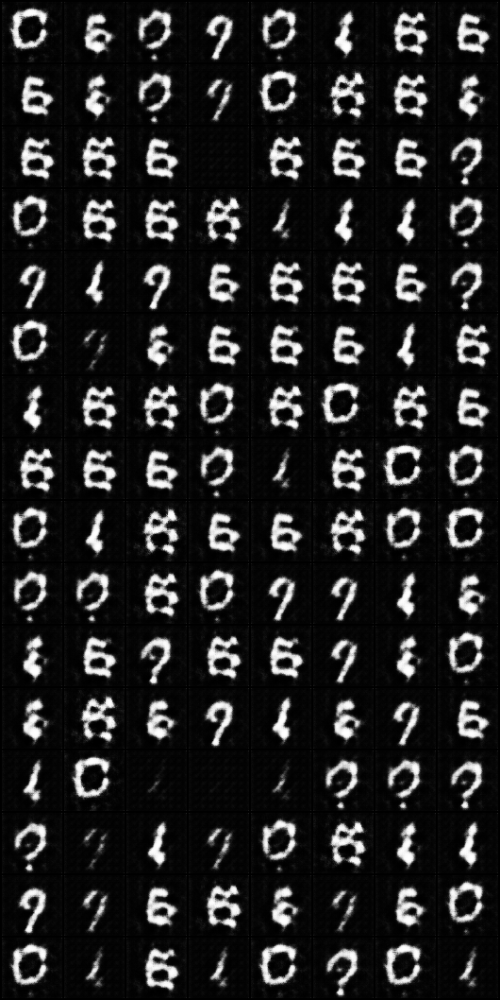

In [28]:
from IPython.display import Image
Image(filename='output/fake_samples_0.png')

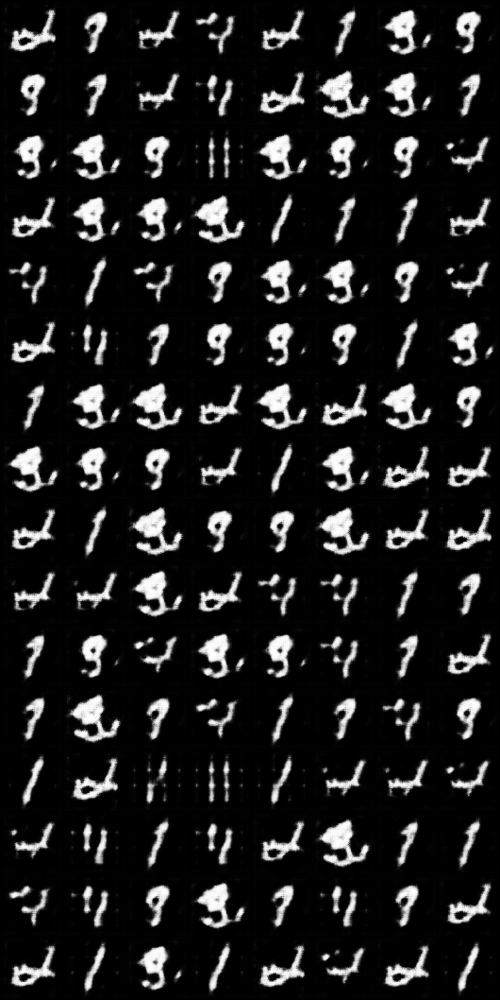

In [29]:
Image(filename='output/fake_samples_1.png')

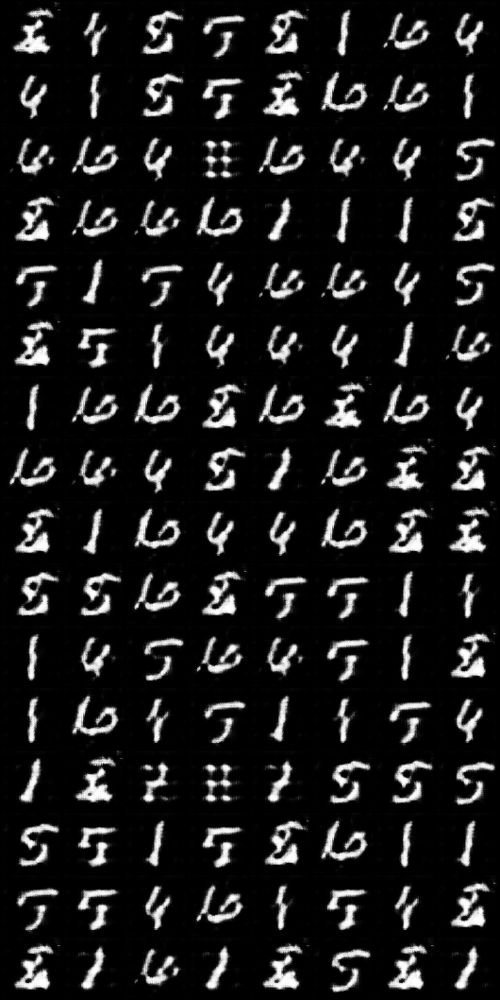

In [30]:
Image(filename='output/fake_samples_2.png')

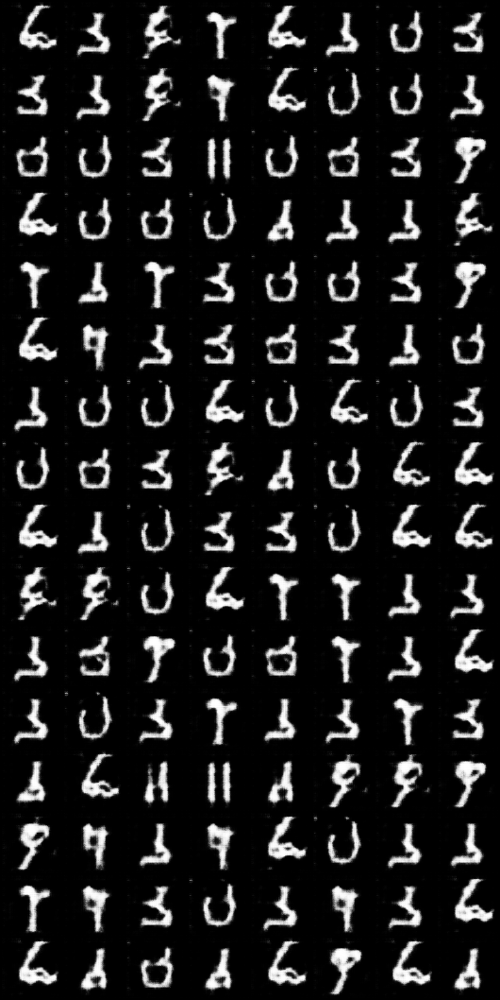

In [31]:
Image(filename='output/fake_samples_3.png')

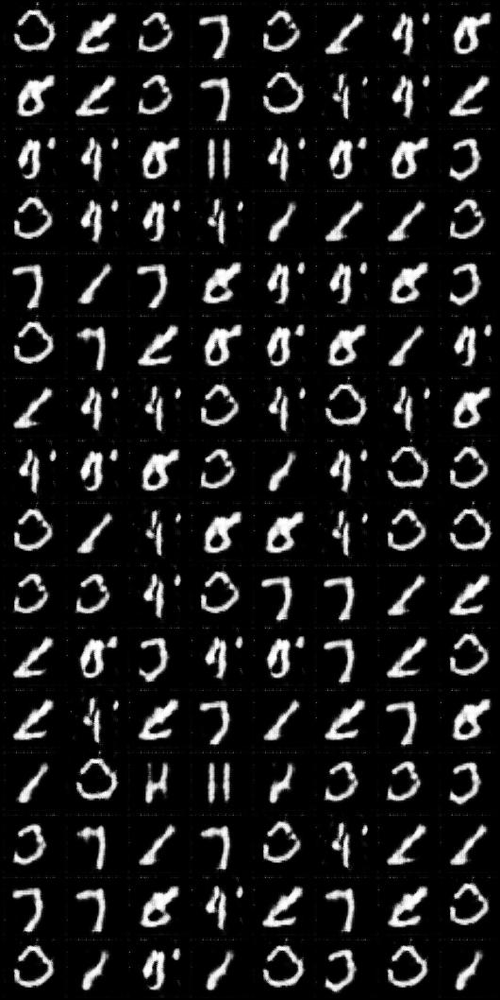

In [32]:
Image(filename='output/fake_samples_4.png')

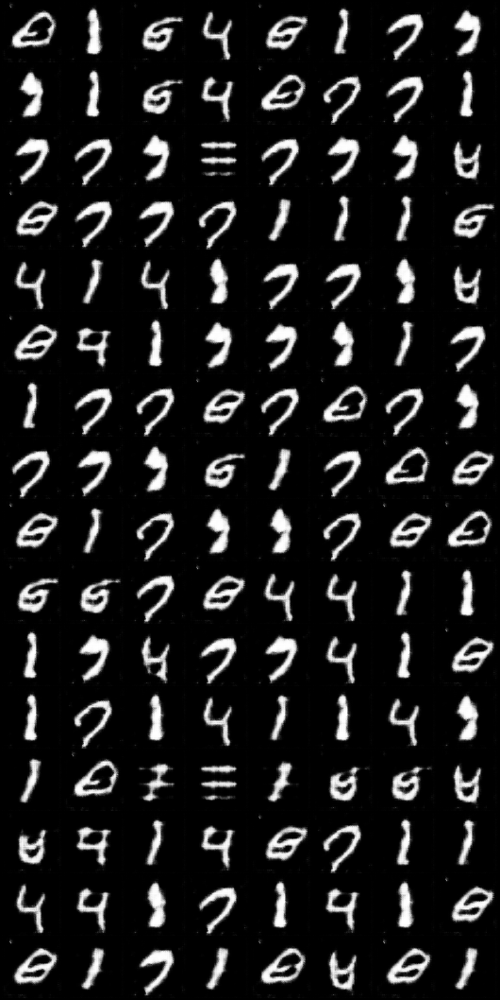

In [33]:
Image(filename='output/fake_samples_5.png')

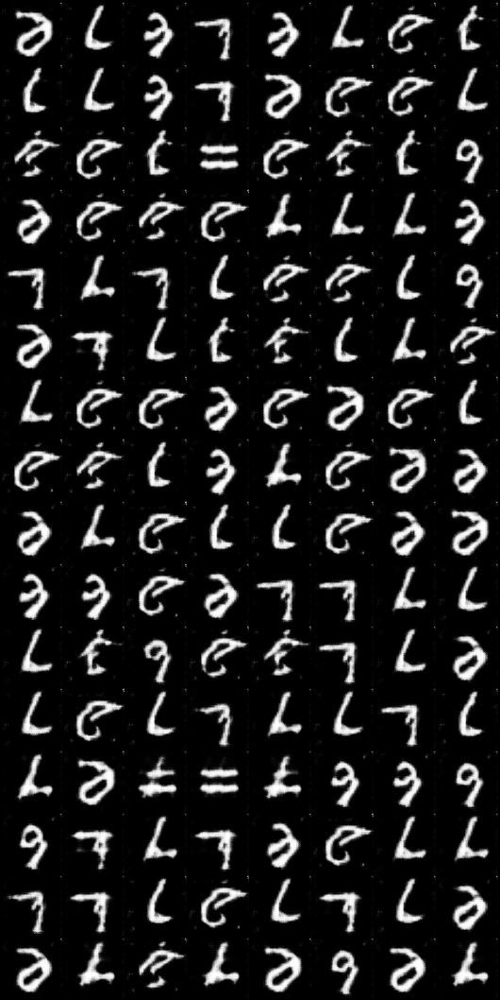

In [34]:
Image(filename='output/fake_samples_6.png')

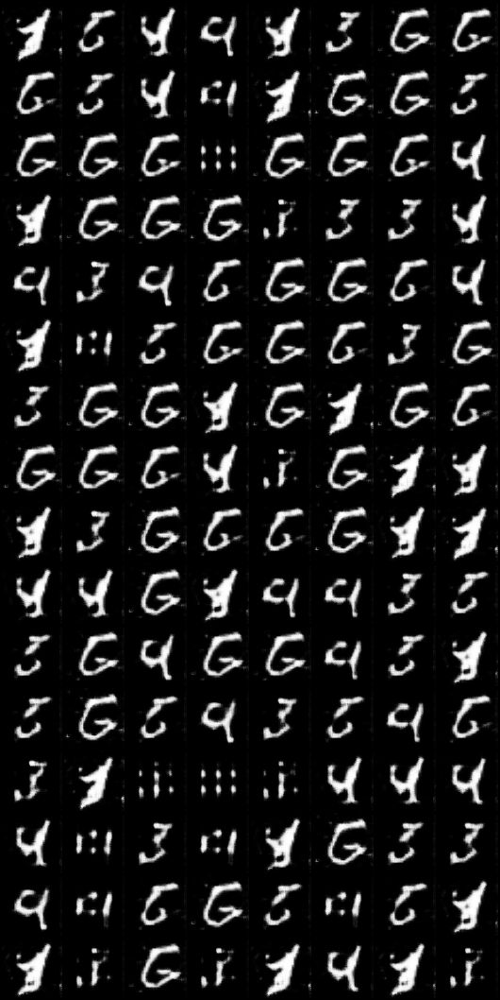

In [35]:
Image(filename='output/fake_samples_7.png')

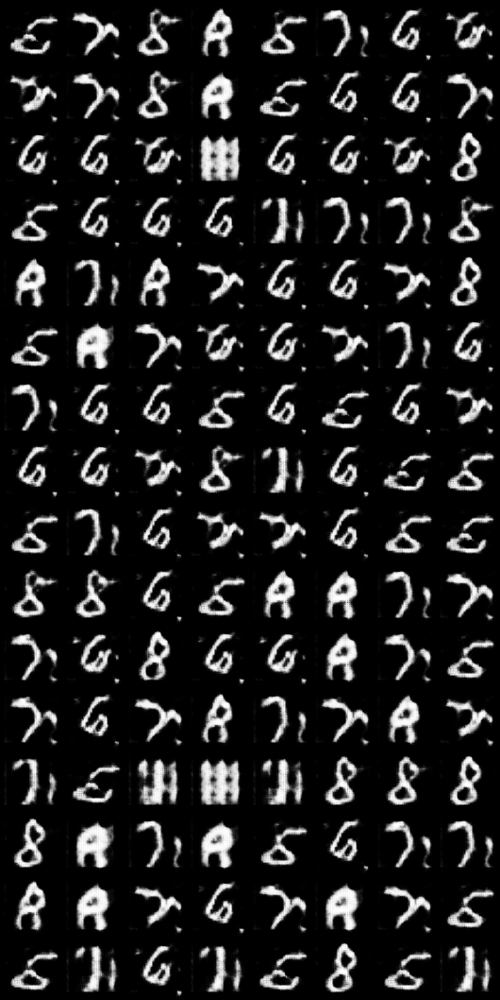

In [36]:
Image(filename='output/fake_samples_8.png')

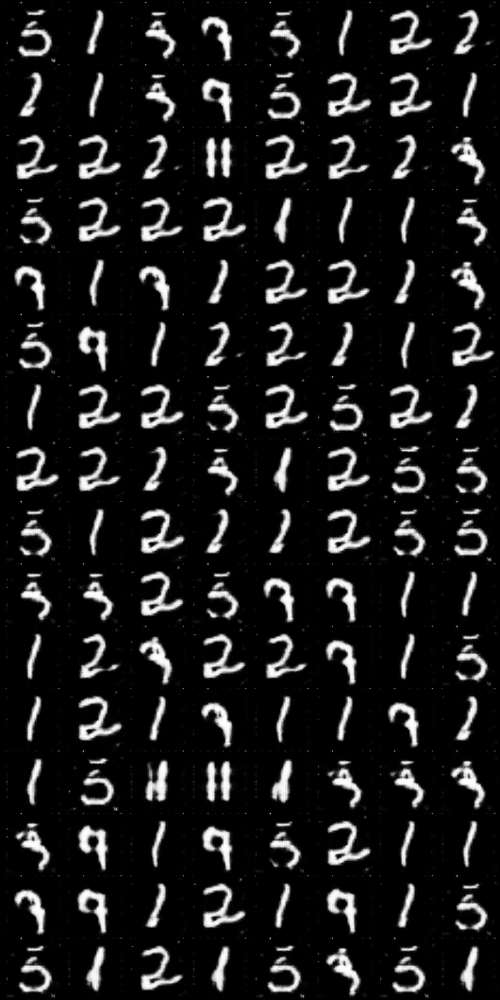

In [37]:
Image(filename='output/fake_samples_9.png')

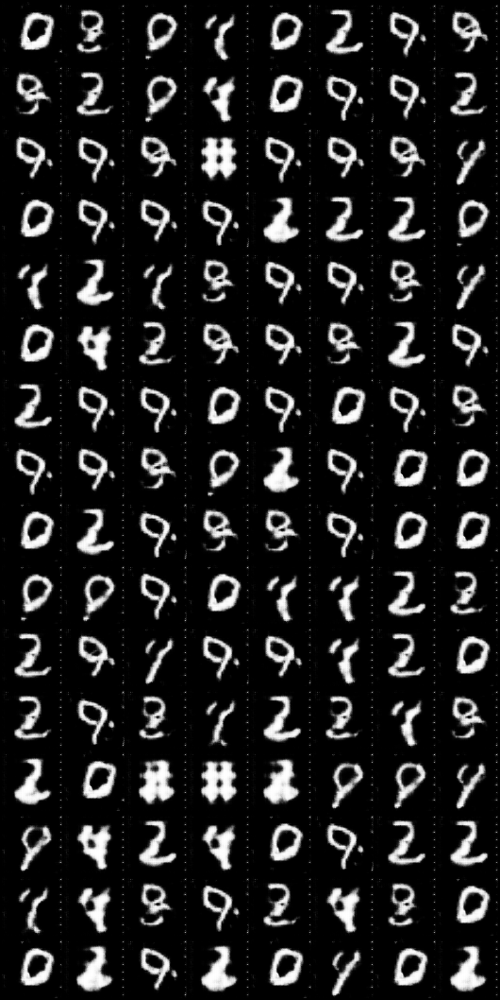

In [38]:
Image(filename='output/fake_samples_10.png')

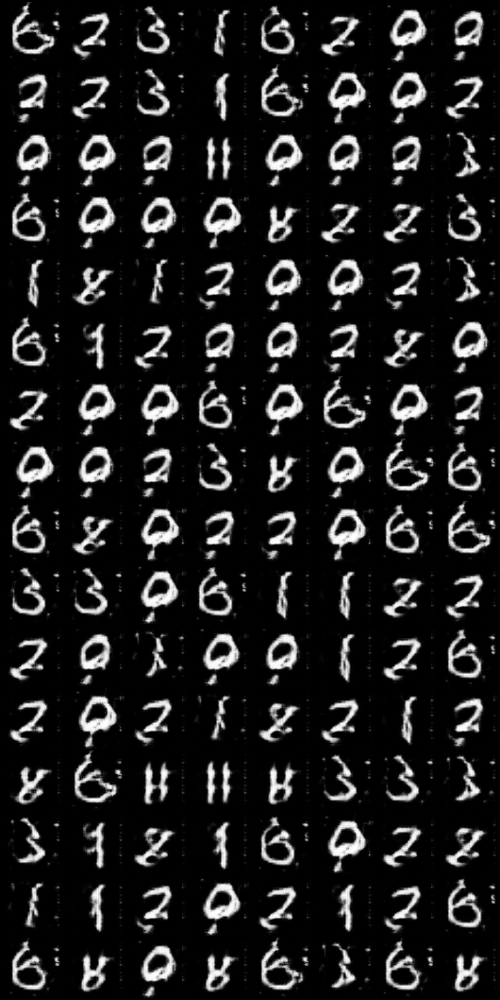

In [39]:
Image(filename='output/fake_samples_11.png')

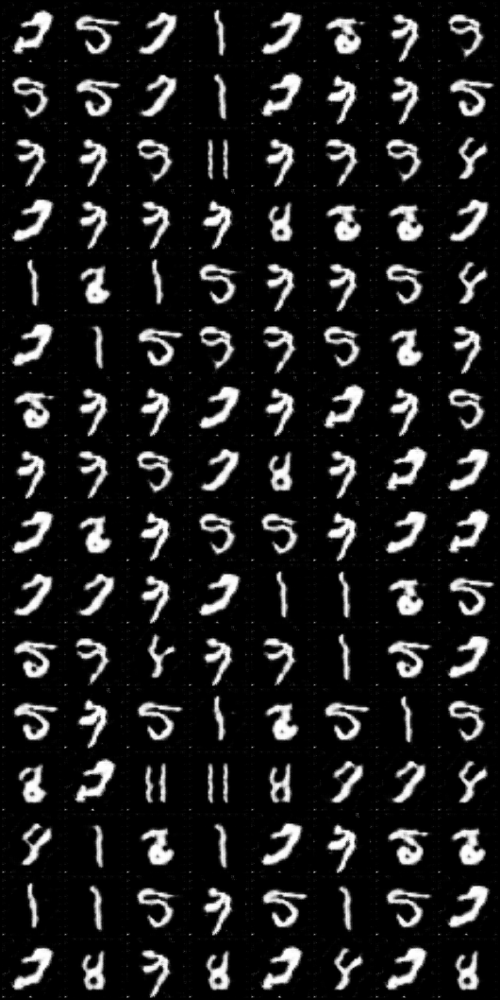

In [40]:
Image(filename='output/fake_samples_12.png')

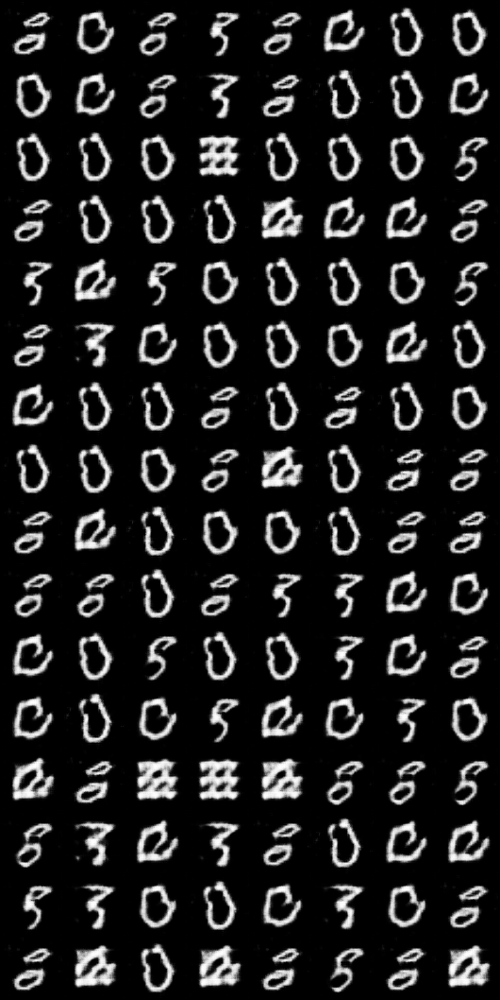

In [41]:
Image(filename='output/fake_samples_13.png')

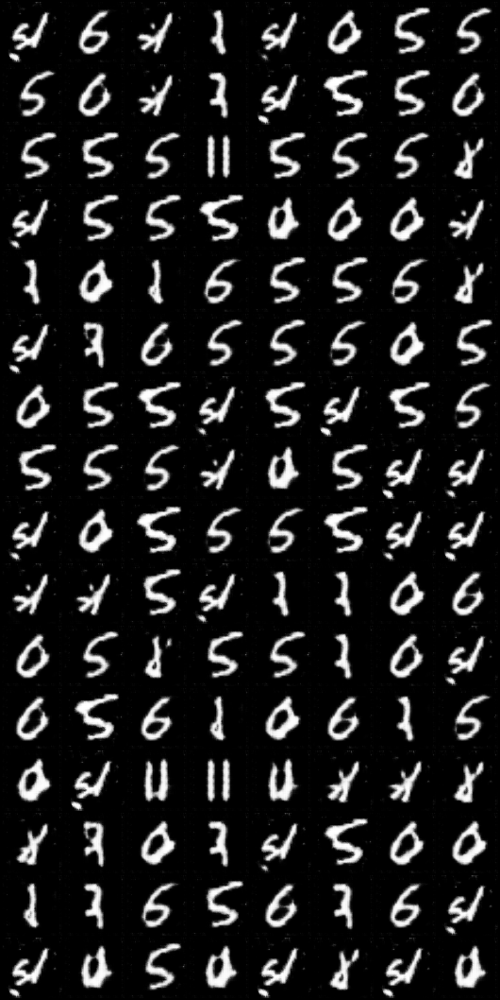

In [42]:
Image(filename='output/fake_samples_14.png')

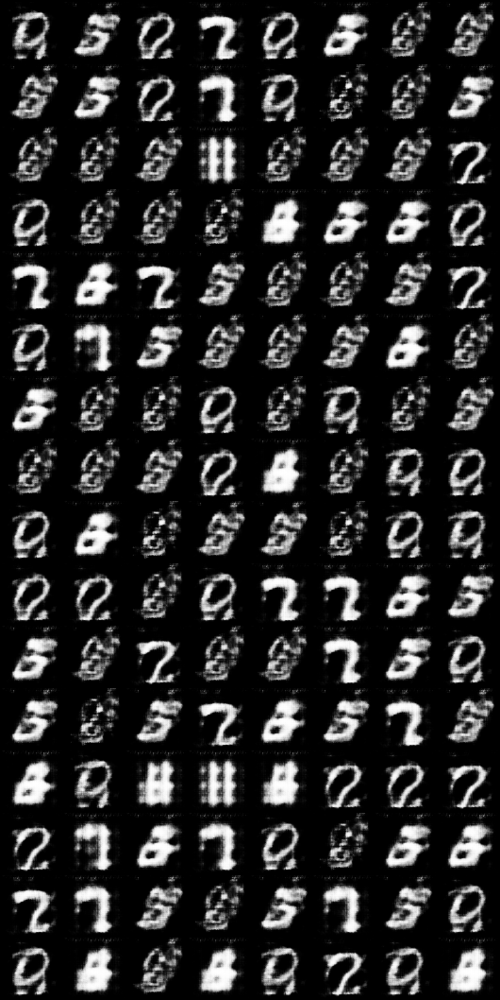

In [43]:
Image(filename='output/fake_samples_15.png')

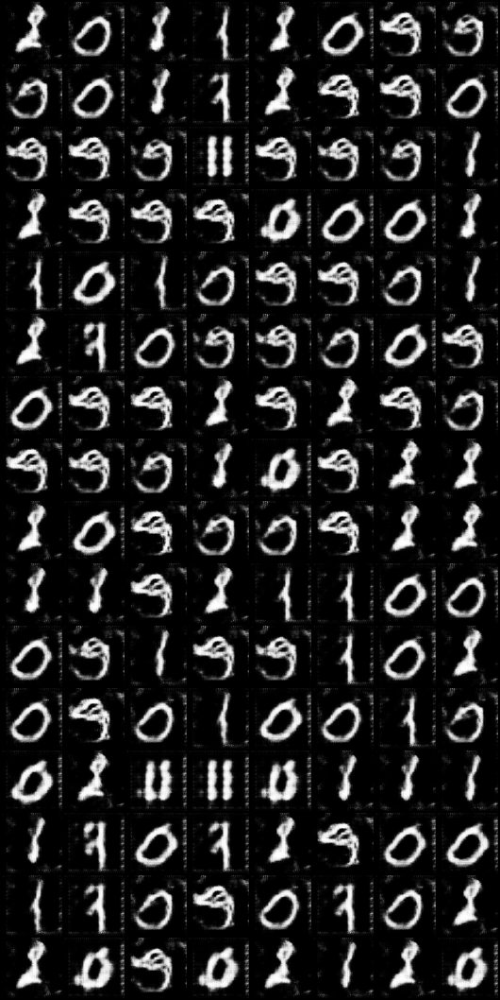

In [44]:
Image(filename='output/fake_samples_16.png')

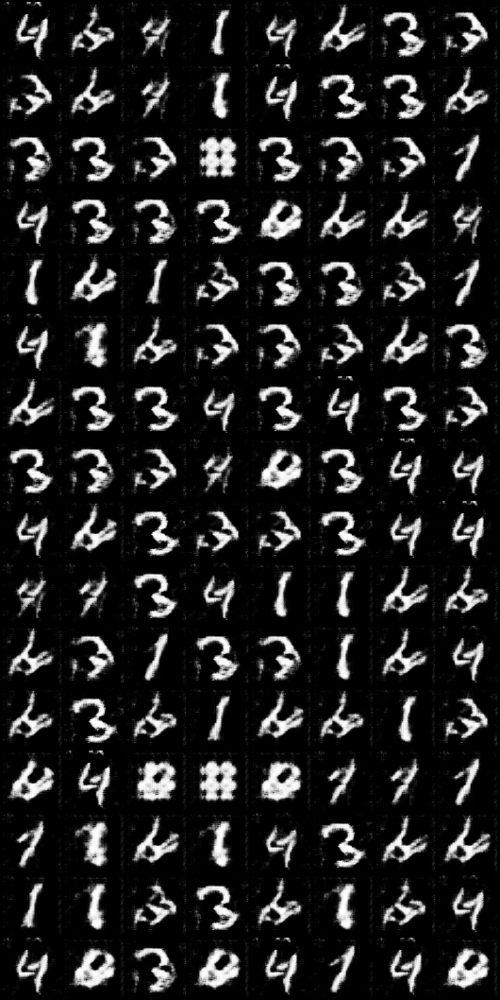

In [45]:
Image(filename='output/fake_samples_17.png')

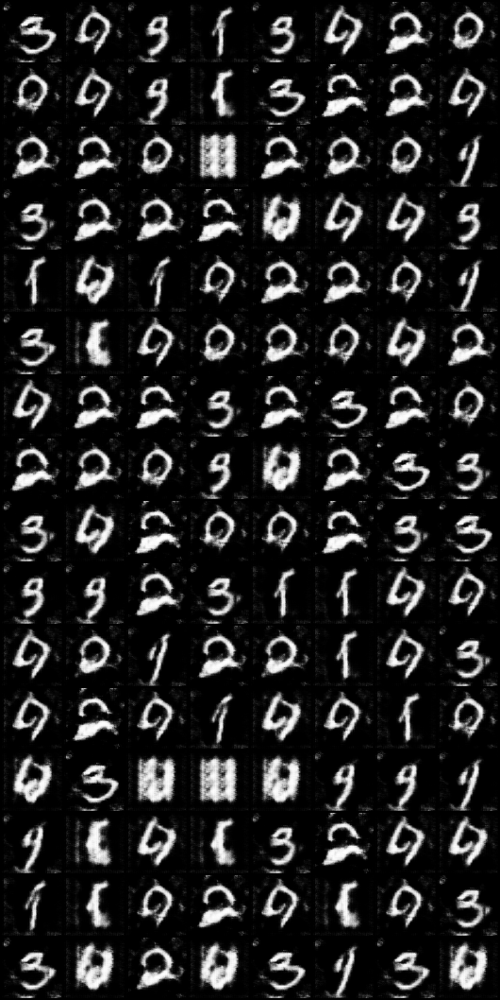

In [46]:
Image(filename='output/fake_samples_18.png')

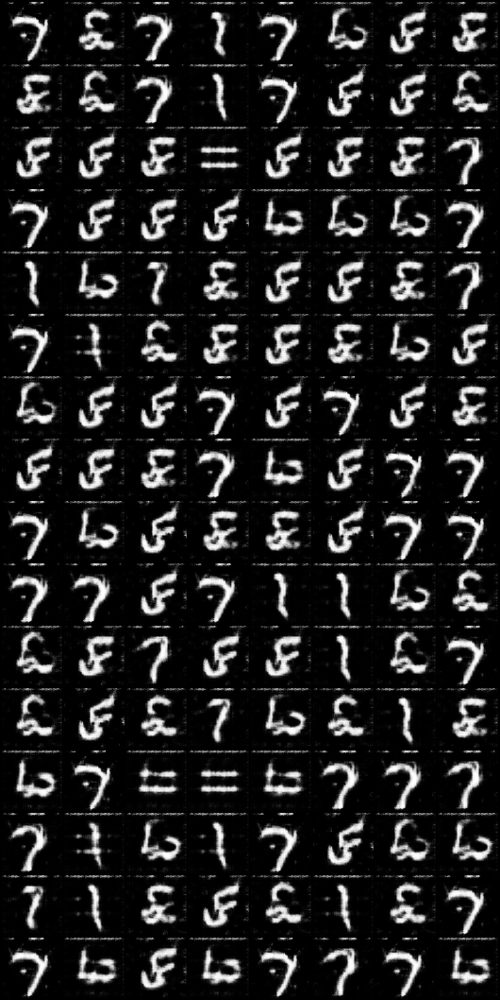

In [47]:
Image(filename='output/fake_samples_19.png')

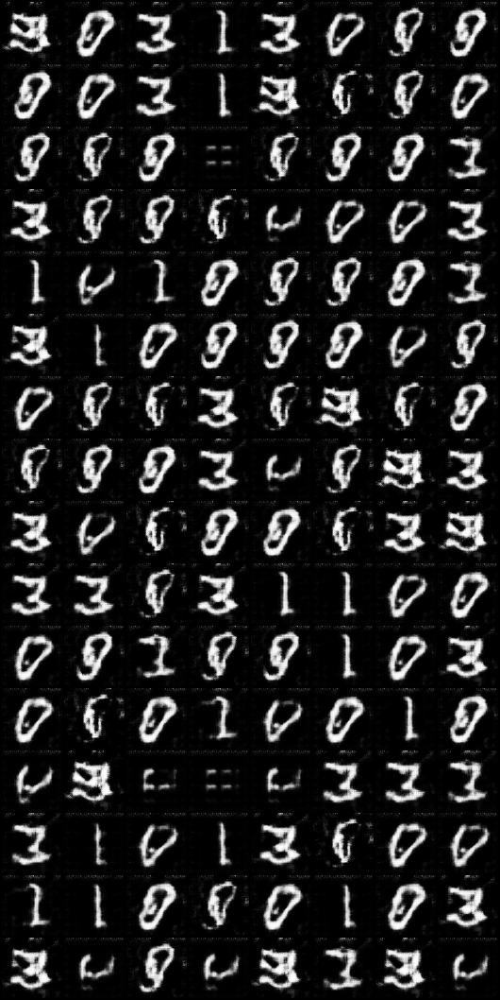

In [48]:
Image(filename='output/fake_samples_20.png')

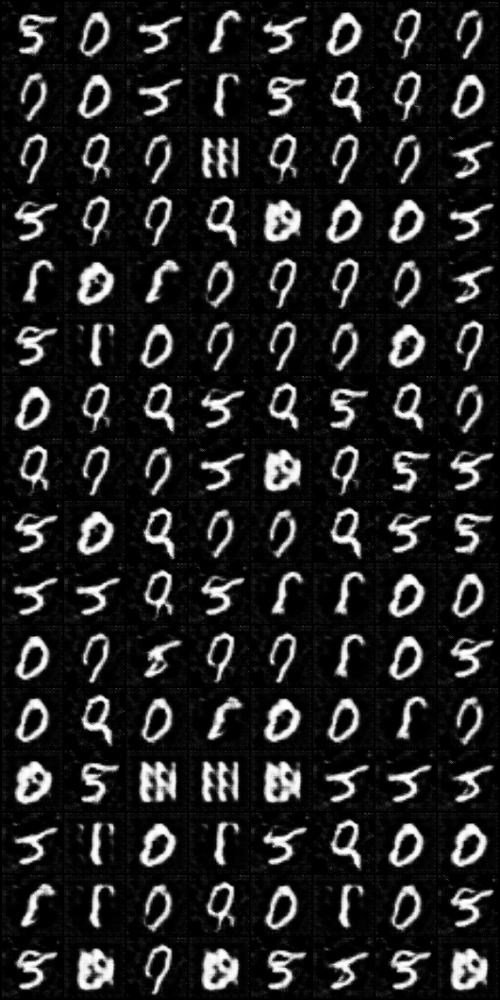

In [49]:
Image(filename='output/fake_samples_21.png')

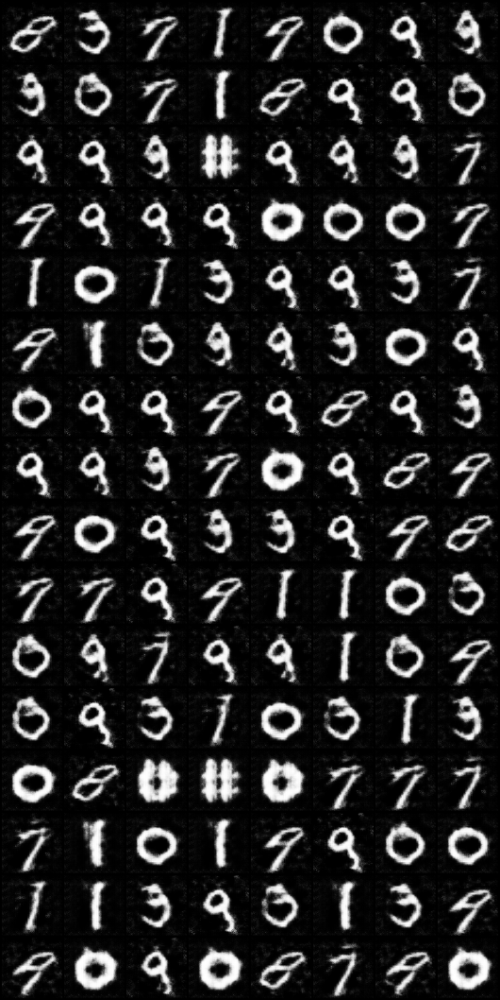

In [50]:
Image(filename='output/fake_samples_22.png')

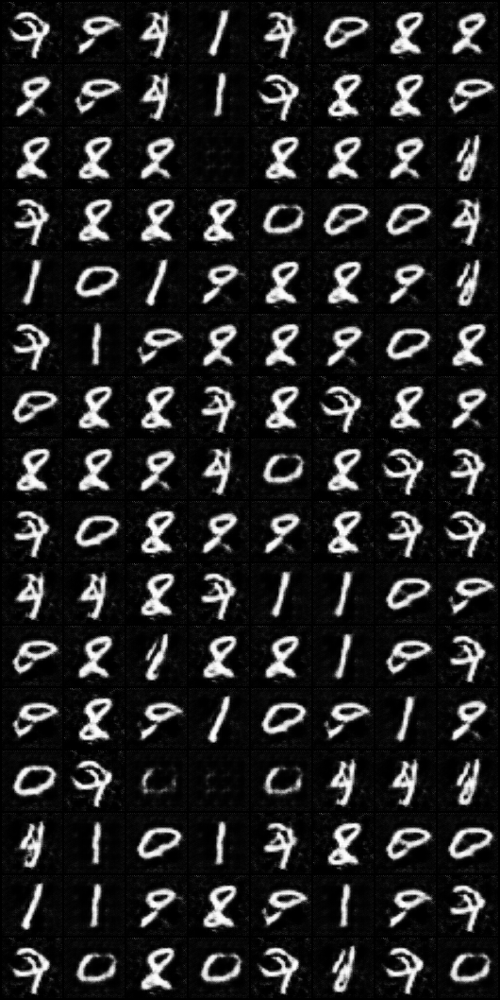

In [51]:
Image(filename='output/fake_samples_23.png')

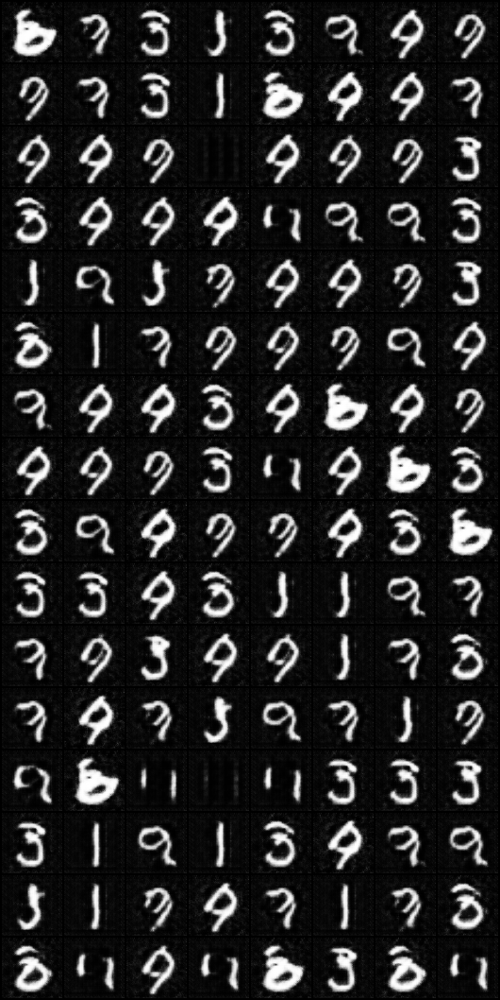

In [52]:
Image(filename='output/fake_samples_24.png')

OKOK performance